# Image Colorization GAN Project


This project aims to take grayscale images in input and ouputs the colorized version by a GAN (Generative Adversial Network) model: pix2pix GAN

We used the coco dataset and the grayscale version was done by the cv2 library by converting RGB photos to the LAB* space

*LAB space is composed by 3 channels:
+ L for Lighteness. It ranges from 0 to 100. It represents the brightness of the color, with 0 being black and 100 being white.
+ A ranges from -128 to 127. It represents the position between red/magenta and green. Negative values indicate green, and positive values indicate magenta.
+ B ranges from -128 to 127. It represents the position between yellow and blue. Negative values indicate blue, and positive values indicate yellow.

### First, we import the necessary libraries

In [1]:
#from datasets import load_dataset
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
from PIL import Image
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.optimizers import Adam
from skimage.color import rgb2lab, lab2rgb

#### Let's load the data

In [2]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [19]:
data= os.listdir("/content/drive/MyDrive/autoencoder_dataset")

In [20]:
len(data)

5010

#### Checking the data

In [21]:
print(data[0])

000000140076.jpg


In [22]:
dataset_dir="/content/drive/MyDrive/autoencoder_dataset"


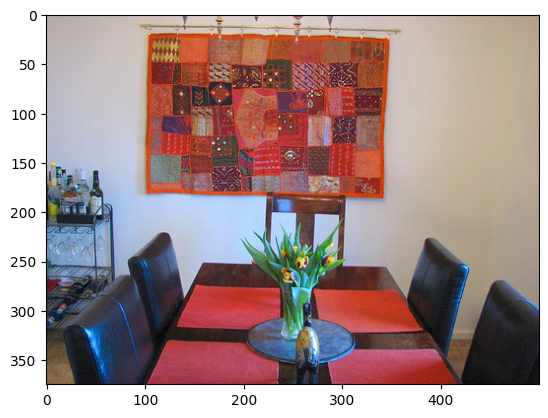

In [23]:
file_path = os.path.join(dataset_dir, data[0])
image=Image.open(file_path)
plt.imshow(image)

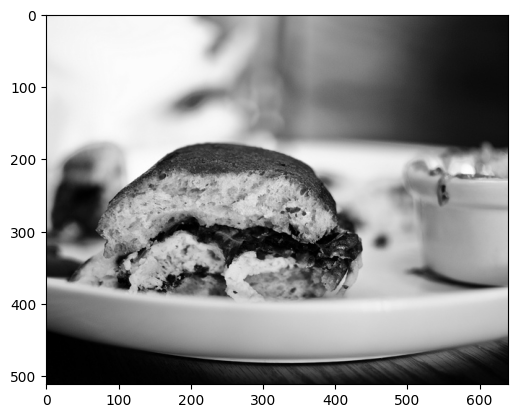

In [24]:
file_path = os.path.join(dataset_dir, "000000001425.jpg")
check_img= Image.open(file_path)
plt.imshow(check_img)

In [25]:
np.array(check_img).shape

(512, 640, 3)

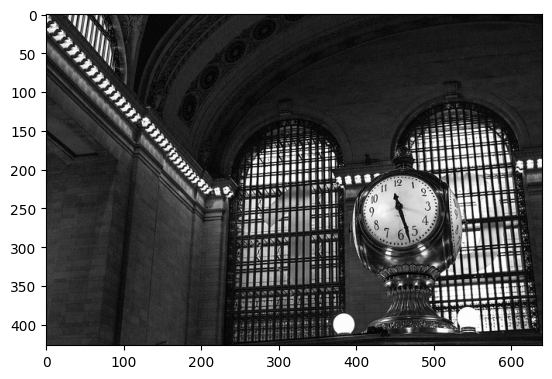

In [26]:

check_img= Image.open(os.path.join(dataset_dir, "000000581482.jpg"))
plt.imshow(check_img)

#### We found some grayscale images in the dataset

In [27]:
np.array(check_img).shape

(427, 640, 3)

#### Checking for not RGB images

In [28]:
i=0
not_rgb=[]

for img in data:
    img_path=os.path.join(dataset_dir, img)
    image=Image.open(img_path)
    if image.mode != 'RGB':
        not_rgb.append(img)
        i+=1

In [29]:
print(i)

10


In [ ]:
"""for img in not_rgb:
    img_path=os.path.join(dataset_dir, img)
    image=Image.open(img_path)
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.axis('off')
    plt.show()"""

"for img in not_rgb:\n    img_path=os.path.join(dataset_dir, img)\n    image=Image.open(img_path)\n    plt.figure(figsize=(6, 6))\n    plt.imshow(image)\n    plt.axis('off')\n    plt.show()"

### But the images that we checked earlier were RGB images

In [30]:
np.array(check_img).shape

(427, 640, 3)

####  Checking the pixel values of each image and determining whether they are uniformly white or black.

In [ ]:
"""# Initialize a list to store images that are not entirely white or black
filtered_images = []

for img in tqdm(data):
    img_path=os.path.join(dataset_dir, img)

    image = Image.open(img_path)

    img_array = np.array(image)

    # Check if the image is not entirely white or black
    if not np.all(np.logical_or(img_array == 0, img_array == 255)):

        filtered_images.append(img_path)


print(f"Number of remaining images: {len(filtered_images)}")
"""

'# Initialize a list to store images that are not entirely white or black\nfiltered_images = []\n\nfor img in tqdm(data):\n    img_path=os.path.join(dataset_dir, img)\n\n    image = Image.open(img_path)\n\n    img_array = np.array(image)\n\n    # Check if the image is not entirely white or black\n    if not np.all(np.logical_or(img_array == 0, img_array == 255)):\n\n        filtered_images.append(img_path)\n\n\nprint(f"Number of remaining images: {len(filtered_images)}")\n'

####  Grayscale images typically have pixel values where the RGB channels are equal (R = G = B)

In [31]:
# Initialize a list to store images that are entirely white or black
filtered_images = []

for img in tqdm(data):
    img_path=os.path.join(dataset_dir, img)
    image = Image.open(img_path)

    image_array = np.array(image)

    # Check if the image is not entirely white or black
    if (image_array.ndim == 3) and (np.all(image_array[:,:,0] == image_array[:,:,1])) and (np.all(image_array[:,:,0] == image_array[:,:,2])):
        # Image is RGB
        filtered_images.append(img)


print(f"Number of filtered images: {len(filtered_images)}")


100%|██████████| 5010/5010 [00:38<00:00, 128.94it/s]

Number of filtered images: 125


In [ ]:
"""for img in filtered_images:
    img_path=os.path.join(dataset_dir, img)
    image = Image.open(img_path)
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.axis('off')
    plt.show()"""


"for img in filtered_images:\n    img_path=os.path.join(dataset_dir, img)\n    image = Image.open(img_path)\n    plt.figure(figsize=(6, 6))\n    plt.imshow(image)\n    plt.axis('off')\n    plt.show()"

### We'll remove these images since having grayscale images in the dataset could potentially confuse the model and affect its performance.

In [32]:
for img in not_rgb:
    data.remove(img)
for img in filtered_images:
    data.remove(img)
print(len(data))

4875


In [33]:
dataset=[]
for img in data:
  img_path=os.path.join(dataset_dir, img)
  dataset.append(img_path)
print(len(dataset))

4875


#### => 134 images removed

100%|██████████| 4875/4875 [00:12<00:00, 385.94it/s]


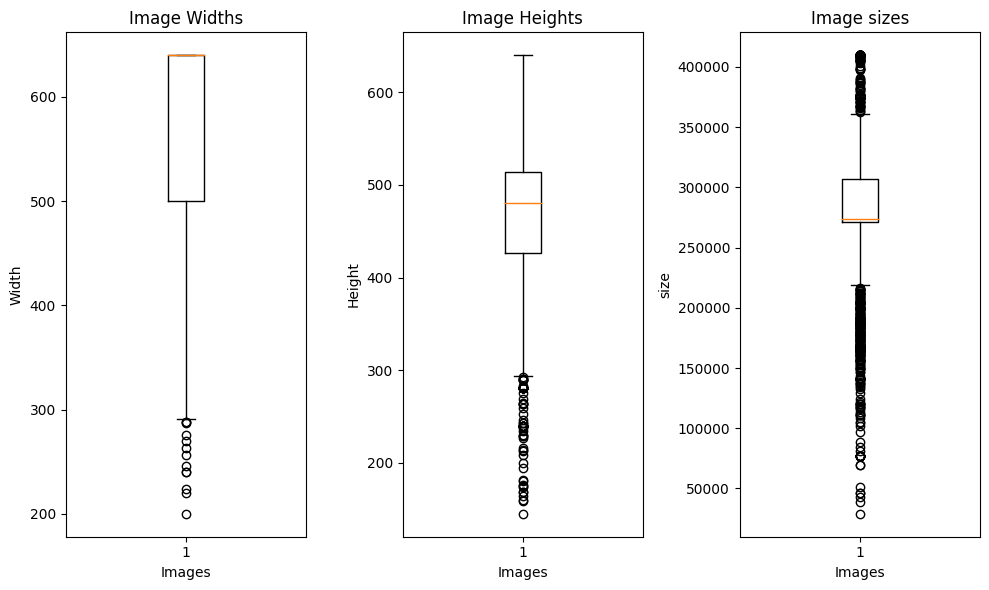

In [34]:
widths = []
heights = []
sizes=[]

for img in tqdm(dataset):

    image = Image.open(img)

    # Get image dimensions (width and height)
    width, height = image.size

    widths.append(width)
    heights.append(height)
    sizes.append(width*height)

# Plot boxplots for image widths and heights
plt.figure(figsize=(10, 6))

plt.subplot(1, 3, 1)
plt.boxplot(widths)
plt.title('Image Widths')
plt.xlabel('Images')
plt.ylabel('Width')

plt.subplot(1, 3, 2)
plt.boxplot(heights)
plt.title('Image Heights')
plt.xlabel('Images')
plt.ylabel('Height')

plt.subplot(1, 3, 3)
plt.boxplot(sizes)
plt.title('Image sizes')
plt.xlabel('Images')
plt.ylabel('size')

plt.tight_layout()
plt.show()


#### Based on the medians, we better resize all images to 640 * 480 but due to ressources reasons we'll resize to 64 * 64

In [3]:
# Output directory to save resized images
output_dir = "/content/drive/MyDrive/lab_dataset_64_64"

In [35]:
# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

X=[]
Y=[]
for path in tqdm(data):
    img=os.path.join(dataset_dir, path)
    # Resize the image to 64*64
    image = np.array(Image.open(img).resize((64, 64)))
    #RGB to LAB
    lab_img=rgb2lab(image/255)
    x = lab_img[:, :, 0]
    y = lab_img[:, :, 1:]
    y /= 128  # normalize
    # Save the resized image to the output directory
    output_path = os.path.join(output_dir, path)
    Image.fromarray(lab_img.astype(np.uint8)).save(output_path)
    X.append(x.reshape(64, 64, 1))
    Y.append(y)

X = np.array(X, dtype=np.float32)
Y = np.array(Y, dtype=np.float32)

np.save(os.path.join(output_dir, "X.npy"), X)
np.save(os.path.join(output_dir, "Y.npy"), Y)
print("All images have been resized to 64*64 and saved to the output directory.")


100%|██████████| 4875/4875 [01:29<00:00, 54.76it/s]


All images have been resized to 64*64 and saved to the output directory.


X stands for Lighteness data

Y stands for ab data

In [36]:
data=os.listdir(output_dir)

In [ ]:
#data = [filename for filename in os.listdir(output_dir) if not filename.startswith("_augmented")]


In [37]:
print(len(data))

4886


In [38]:
data = [file for file in data if os.path.splitext(file)[1].lower() =='.jpg']

In [39]:
print(len(data))

4875


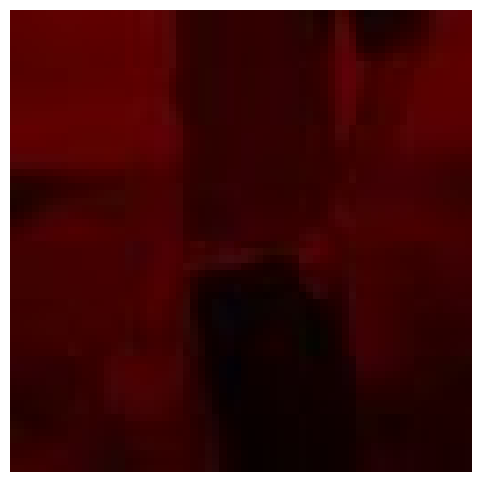

In [40]:
img_path0=os.path.join(output_dir, data[60])
image = Image.open(img_path0)
plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.axis('off')
plt.show()

In [41]:
import cv2

### Let's proceed to data augmentation

In [ ]:
"""
# Define data augmentation parameters
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest'
)

# Create an iterator for augmented data
for img in tqdm(X_train):
    # Construct the full file path
    img_path = os.path.join(output_dir, img)

    # Open the image using PIL
    image = Image.open(img_path)

    # Convert the image to a NumPy array
    img_array = np.array(image)

    # Reshape the image to meet the input shape requirement of flow method
    img_array = img_array.reshape((1,) + img_array.shape)

    # Generate augmented samples and update dataset
    augmented_data_iter = datagen.flow(img_array, batch_size=1)
    augmented_images = augmented_data_iter.next()

    # Save the augmented image
    augmented_image = Image.fromarray(augmented_images[0].astype('uint8'))
    augmented_image.save(img_path.replace(output_dir+"/", output_dir+"/_augmented"))

print("Data augmentation applied to the training set.")
"""

In [ ]:
#augmented_paths = [img_path for img_path in os.listdir(output_dir) if img_path.startswith("_augmented")]

In [ ]:
#print(len(augmented_paths))


In [ ]:
#print(augmented_paths[0])

In [ ]:
#X_train.extend(augmented_paths)

In [ ]:
#print(len(X_train))

In [42]:
EPOCHS = 50
BATCH_SIZE = 25
SHUFFLE_BUFFER_SIZE = 50
WORKDIR= output_dir

**Loading dataset**

In [43]:
X_train=X[:4000]
X_test=X[4000:]
Y_train=Y[:4000]
Y_test=Y[4000:]

In [44]:
len(Y_test)

875

In [45]:
type(X_train[1])

numpy.ndarray

In [46]:
np.save(os.path.join(WORKDIR, "X_train.npy"), X_train)
np.save(os.path.join(WORKDIR, "Y_train.npy"), Y_train)
np.save(os.path.join(WORKDIR, "X_test.npy"), X_test)
np.save(os.path.join(WORKDIR, "Y_test.npy"), Y_test)

In [47]:
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, Y_train))
test_dataset = tf.data.Dataset.from_tensor_slices((X_test, Y_test))

train_dataset = train_dataset.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [48]:
input_shape = (64,64, 1) # Height, width, and 1 channel for grayscale images
output_shape = (64,64, 3) # Height, width, and 3 channels for colorized images

### GAN Architecture

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Conv2DTranspose,MaxPooling2D, BatchNormalization, LeakyReLU, Activation

def make_generator_model(input_shape):
    model = Sequential()
    model.add(Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=input_shape))
    model.add(Conv2D(64, (3, 3), padding='same', strides=2, activation='relu'))
    model.add(BatchNormalization())
    #model = MaxPooling2D(pool_size=(2, 2))(model)

    model.add(Conv2D(128, (3, 3), padding='same', activation='relu', strides=2))
    model.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
    model.add(BatchNormalization())
    #model = MaxPooling2D(pool_size=(2, 2))(model)

    model.add(Conv2D(256, (3, 3), padding='same'))
    model.add(Activation('relu'))
    model.add(BatchNormalization())

    model.add(UpSampling2D(size=(2,2)))
    model.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
    model.add(BatchNormalization())

    model.add(UpSampling2D(size=(2,2)))
    model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
    model.add(BatchNormalization())

    model.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
    model.add(Conv2D(2, (3, 3), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('tanh'))
    #self.model = BatchNormalization()(self.model)
    #self.model = merge(inputs=[self.g_input, self.model], mode='concat')
    #self.model = Activation('linear')(self.model)
    return model

# Define the input shape for the generator

generator = make_generator_model(input_shape)

# Print the summary of the generator model
generator.summary()


Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_22 (Conv2D)          (None, 64, 64, 32)        320       
                                                                 
 conv2d_23 (Conv2D)          (None, 32, 32, 64)        18496     
                                                                 
 batch_normalization_14 (Ba  (None, 32, 32, 64)        256       
 tchNormalization)                                               
                                                                 
 conv2d_24 (Conv2D)          (None, 16, 16, 128)       73856     
                                                                 
 conv2d_25 (Conv2D)          (None, 16, 16, 128)       147584    
                                                                 
 batch_normalization_15 (Ba  (None, 16, 16, 128)       512       
 tchNormalization)                                    

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import (
    Activation, BatchNormalization, Conv2D, Conv2DTranspose, Dropout,
    Input, LeakyReLU, ReLU, UpSampling2D, Concatenate)
from tensorflow.keras.models import Model, Sequential

def downsample(filters, kernel_size, apply_batchnorm=True):
    initializer = tf.random_uniform_initializer(0, 0.02)
    model = Sequential()
    model.add(Conv2D(filters, kernel_size, strides=2, padding='same',
                     kernel_initializer=initializer, use_bias=False))

    if apply_batchnorm:
        model.add(BatchNormalization())

    model.add(LeakyReLU())
    return model

def upsample(filters, kernel_size, apply_dropout=False):
    initializer = tf.random_uniform_initializer(0, 0.02)
    model = Sequential()
    model.add(Conv2DTranspose(filters, kernel_size, strides=2, padding='same',
                              kernel_initializer=initializer, use_bias=False))
    model.add(BatchNormalization())

    if apply_dropout:
        model.add(Dropout(0.5))

    model.add(ReLU())
    return model

def make_autoencoder_generator_model(input_shape):
    inputs = Input(shape=input_shape)

    # Downsampling layers
    downstack = [
        downsample(32, 4, apply_batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4),
        downsample(256, 4)
    ]

    # Upsampling layers
    upstack = [
        upsample(256, 4, apply_dropout=True),
        upsample(128, 4),
        upsample(64, 4),
        upsample(32, 4),
    ]

    initializer = tf.random_uniform_initializer(0, 0.02)
    output_layer = Conv2DTranspose(2, 3, strides=2, padding='same',
                                   kernel_initializer=initializer,
                                   activation='tanh')  # (bs, 64, 96, 2)

    x = inputs

    # Downsampling
    skips = []
    for down in downstack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling
    for up, skip in zip(upstack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = output_layer(x)

    return Model(inputs=inputs, outputs=x)

# Define the input shape for the generator
autoencoder_generator = make_autoencoder_generator_model(input_shape)

# Print the summary of the autoencoder generator model
autoencoder_generator.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 64, 64, 1)]          0         []                            
                                                                                                  
 sequential_6 (Sequential)   (None, 32, 32, 32)           512       ['input_1[0][0]']             
                                                                                                  
 sequential_7 (Sequential)   (None, 16, 16, 64)           33024     ['sequential_6[0][0]']        
                                                                                                  
 sequential_8 (Sequential)   (None, 8, 8, 128)            131584    ['sequential_7[0][0]']        
                                                                                              

In [ ]:
from tensorflow.keras.layers import Flatten, Dense, AveragePooling2D

def make_discriminator_model(output_shape):
    model = Sequential()
    model.add(Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=output_shape))
    model.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
    model.add(AveragePooling2D(pool_size=(2, 2)))
    model.add(Dropout(.25))

    model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
    model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
    model.add(AveragePooling2D(pool_size=(2, 2)))
    model.add(Dropout(.25))

    model.add(Flatten())
    model.add(Dense(512))
    model.add(LeakyReLU(.2))
    model.add(BatchNormalization())
    model.add(Dropout(.5))
    model.add(Dense(1))
    model.add(Activation('sigmoid'))

    return model


# Define the input shape for the discriminator
discriminator = make_discriminator_model(output_shape)

discriminator.summary()


Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_36 (Conv2D)          (None, 64, 64, 32)        896       
                                                                 
 conv2d_37 (Conv2D)          (None, 64, 64, 32)        9248      
                                                                 
 average_pooling2d (Average  (None, 32, 32, 32)        0         
 Pooling2D)                                                      
                                                                 
 dropout_1 (Dropout)         (None, 32, 32, 32)        0         
                                                                 
 conv2d_38 (Conv2D)          (None, 32, 32, 64)        18496     
                                                                 
 conv2d_39 (Conv2D)          (None, 32, 32, 64)        36928     
                                                     

In [ ]:
LAMBDA = 100
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)


def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = cross_entropy(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = cross_entropy(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss


def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = cross_entropy(tf.ones_like(disc_generated_output), disc_generated_output)
    # mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)
    return total_gen_loss, gan_loss, l1_loss


In [ ]:
# Create a new directory to store checkpoints
checkpoint_dir = os.path.join(output_dir, 'training-checkpoints')
os.makedirs(checkpoint_dir, exist_ok=True)

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input


# Compile the combined GAN model

generator = make_autoencoder_generator_model(input_shape)
discriminator = make_discriminator_model(output_shape)

generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)


checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)
manager = tf.train.CheckpointManager(checkpoint, checkpoint_dir, max_to_keep=3)



In [ ]:
from datetime import datetime
summary_log_file = os.path.join(
    WORKDIR, 'tf-summary', datetime.now().strftime("%Y%m%d-%H%M%S"))
summary_writer = tf.summary.create_file_writer(summary_log_file)

@tf.function
def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator(tf.keras.layers.concatenate([input_image, target]), training=True)
        disc_generated_output = discriminator(tf.keras.layers.concatenate([input_image, gen_output]), training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(
            disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss,
                                            generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                                 discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
        tf.summary.scalar('disc_loss', disc_loss, step=epoch)

    return gen_total_loss, disc_loss

## Time for training !

In [ ]:

checkpoint.restore(manager.latest_checkpoint)
if manager.latest_checkpoint:
    print('Restored from {}'.format(manager.latest_checkpoint))
    initial_epoch = int(manager.latest_checkpoint.split('-')[-1])*10
    print(initial_epoch)
else:
    print('Initializing from scratch')

Restored from /content/drive/MyDrive/lab_dataset_64_64/training-checkpoints/ckpt-4
40


In [ ]:
from time import time
for e in tqdm(range(initial_epoch, EPOCHS)):
    start_time = time()
    gen_loss_total = disc_loss_total = 0
    for input_image, target in tqdm(train_dataset):
        gen_loss, disc_loss = train_step(input_image, target, e)
        gen_loss_total += gen_loss
        disc_loss_total += disc_loss

    time_taken = time() - start_time

    if (e + 1) % 10 == 0:
        checkpoint.save(file_prefix=checkpoint_prefix)

    # print('Epoch {}: gen loss: {}, disc loss: {}, time: {:.2f}s'.format(
    #     e + 1, gen_loss_total / BATCH_SIZE, disc_loss_total / BATCH_SIZE, time_taken))

Streaming output truncated to the last 5000 lines.
100%|██████████| 100/100 [14:25<00:00,  8.66s/it]


### Let's find out the results

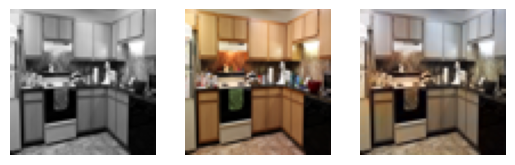

1 / 50

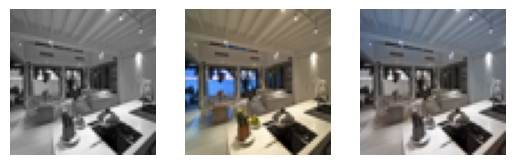

2 / 50

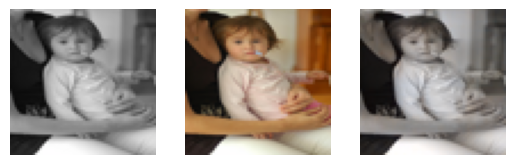

3 / 50

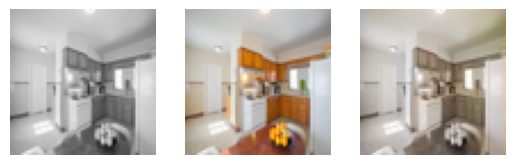

4 / 50

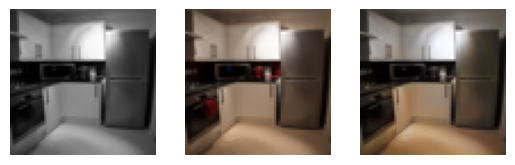

5 / 50

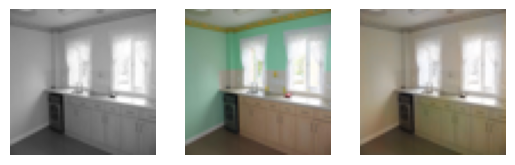

6 / 50

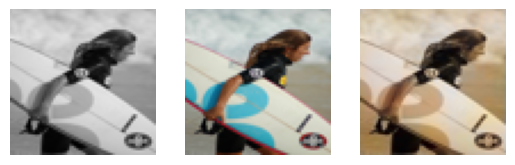

7 / 50

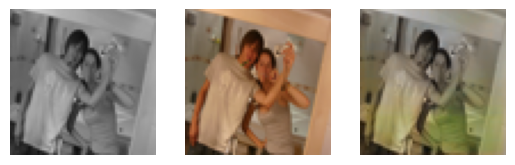

8 / 50

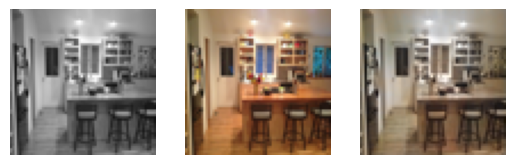

9 / 50

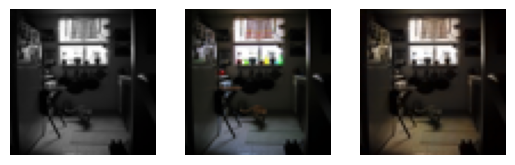

10 / 50

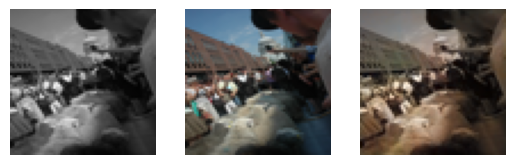

11 / 50

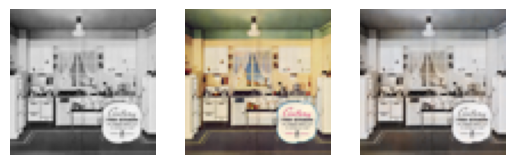

12 / 50

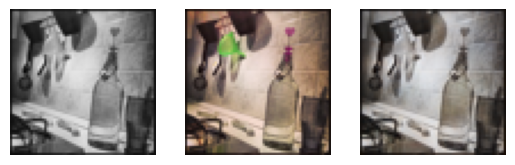

13 / 50

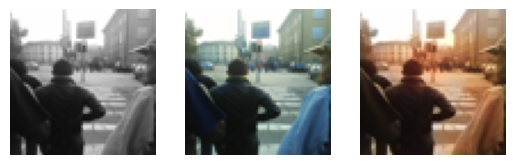

14 / 50

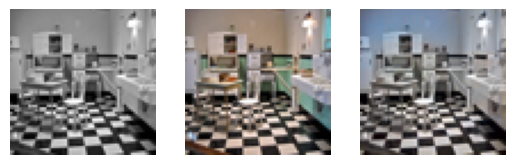

15 / 50

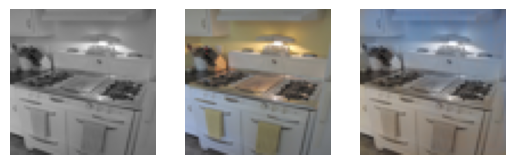

16 / 50

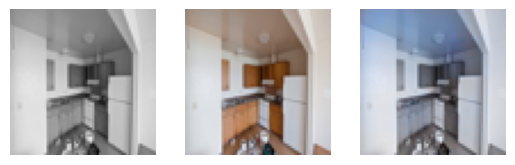

17 / 50

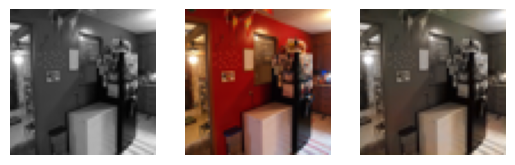

18 / 50

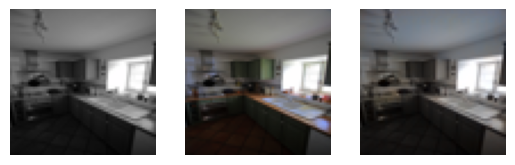

19 / 50

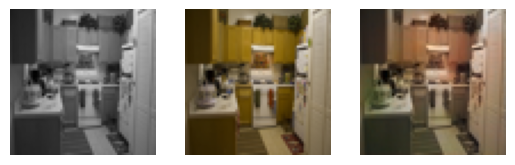

20 / 50

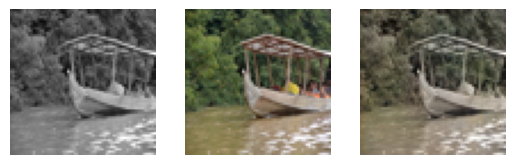

21 / 50

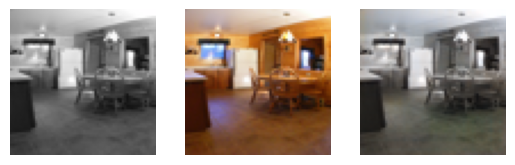

22 / 50

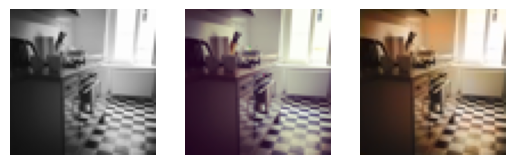

23 / 50

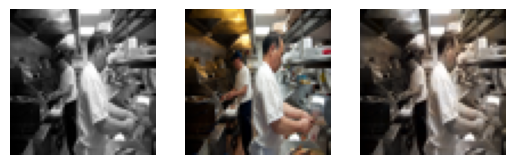

24 / 50

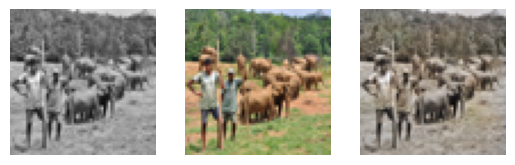

25 / 50

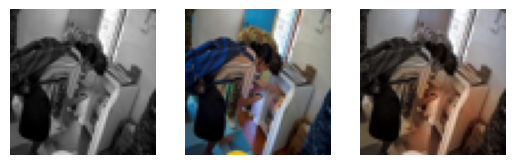

26 / 50

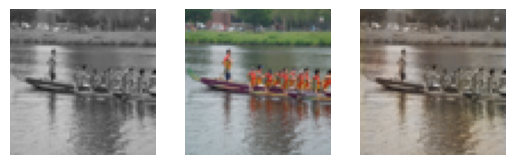

27 / 50

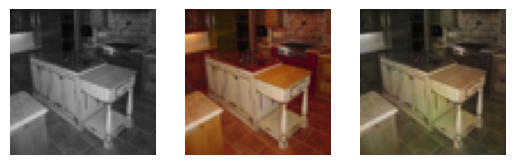

28 / 50

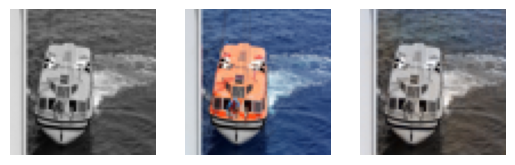

29 / 50

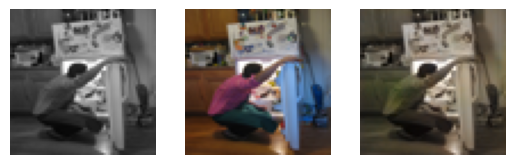

30 / 50

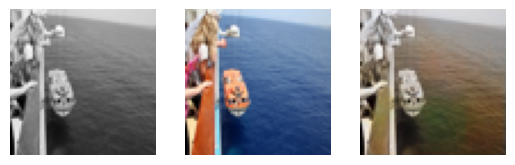

31 / 50

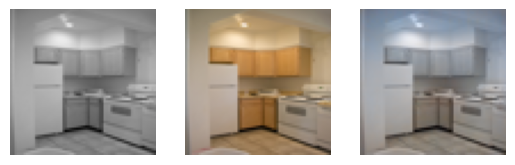

32 / 50

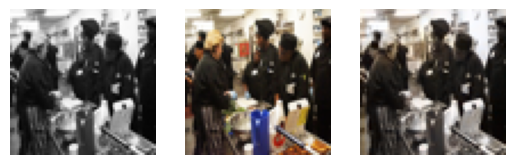

33 / 50

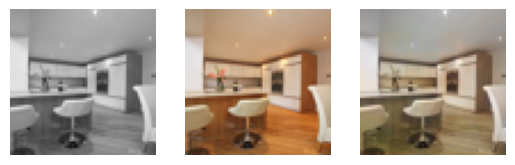

34 / 50

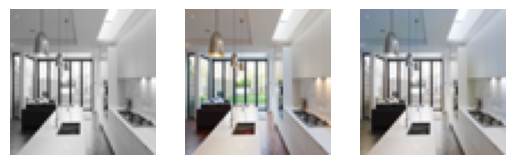

35 / 50

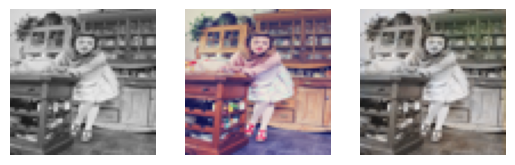

36 / 50

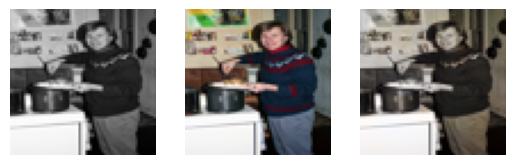

37 / 50

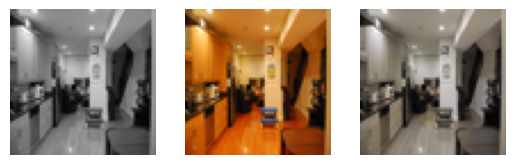

38 / 50

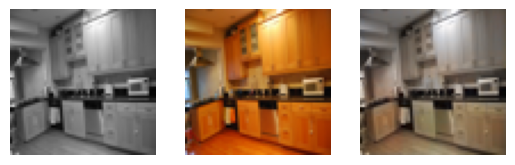

39 / 50

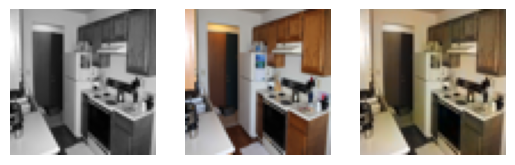

40 / 50

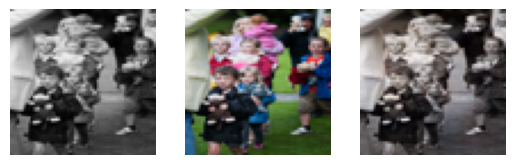

41 / 50

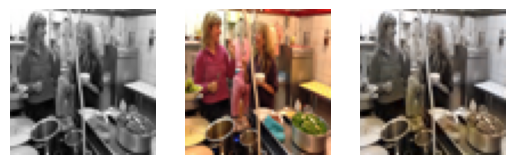

42 / 50

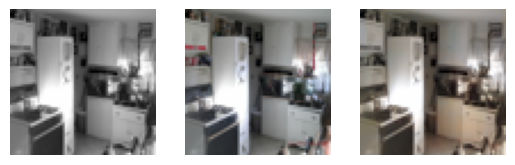

43 / 50

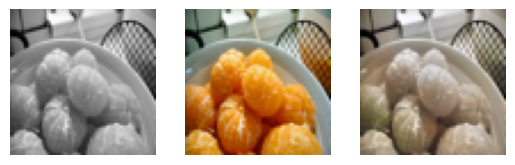

44 / 50

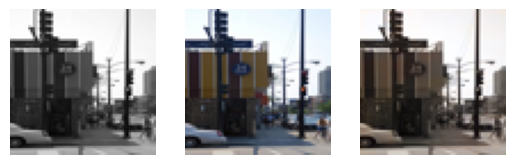

45 / 50

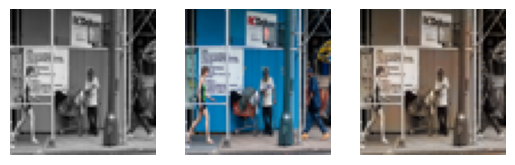

46 / 50

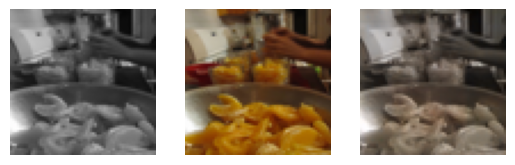

47 / 50

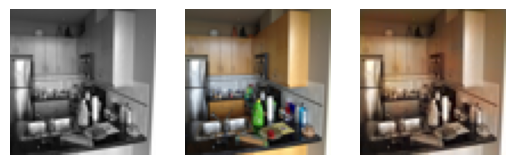

48 / 50

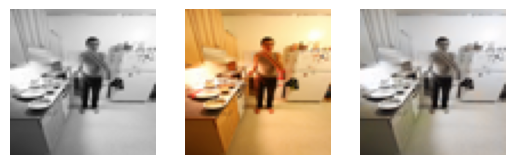

49 / 50

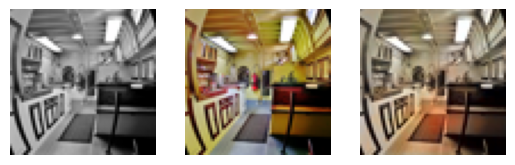

50 / 50

In [50]:
import sys
total_count = len(Y_hat)
Y_hat = generator(X_test[:50])

for idx, (x, y, y_hat) in enumerate(zip(X_test[:50], Y_test[:50], Y_hat)):

    # Original RGB image
    orig_lab = np.dstack((x, y * 128))
    orig_rgb = lab2rgb(orig_lab)

    # Grayscale version of the original image
    grayscale_lab = np.dstack((x, np.zeros((64, 64, 2))))
    grayscale_rgb = lab2rgb(grayscale_lab)

    # Colorized image
    predicted_lab = np.dstack((x, y_hat * 128))
    predicted_rgb = lab2rgb(predicted_lab)

    # print(idx)

    fig = plt.figure()
    fig.add_subplot(1, 3, 1)
    plt.axis('off')
    plt.imshow(grayscale_rgb)
    fig.add_subplot(1, 3, 2)
    plt.axis('off')
    plt.imshow(orig_rgb)
    fig.add_subplot(1, 3, 3)
    plt.axis('off')
    plt.imshow(predicted_rgb)
    plt.show()

    #plt.axis('off')
    #plt.imshow(grayscale_rgb)
    #plt.savefig(os.path.join(WORKDIR, 'results', '{}-bw.png'.format(idx)), dpi=1)

    #plt.axis('off')
    #plt.imshow(orig_rgb)
    #plt.savefig(os.path.join(WORKDIR, 'results', '{}-gt.png'.format(idx)), dpi=1)

    #plt.axis('off')
    #plt.imshow(predicted_rgb)
    #plt.savefig(os.path.join(WORKDIR, 'results', '{}-gan.png'.format(idx)), dpi=1)

    sys.stdout.flush()
    sys.stdout.write('\r{} / {}'.format(idx + 1, total_count))

None


In [9]:
tf.saved_model.save(generator, os.path.join(WORKDIR, "generator-saved-model"))

NameError: name 'generator' is not defined

In [ ]:
tf.saved_model.save(discriminator, os.path.join(WORKDIR, "disciminator-saved-model"))

If you want to use the model later, you only need to load the generator ...

In [49]:
# Load the saved generator model
generator = tf.saved_model.load(os.path.join(output_dir, "generator-saved-model"))

In [ ]:
X_train = np.load(os.path.join(WORKDIR, "X_train.npy"))
Y_train = np.load(os.path.join(WORKDIR, "Y_train.npy"))
X_test = np.load(os.path.join(WORKDIR, "X_test.npy"))
Y_test = np.load(os.path.join(WORKDIR, "Y_test.npy"))

FileNotFoundError: [Errno 2] No such file or directory: 'X_train.npy'

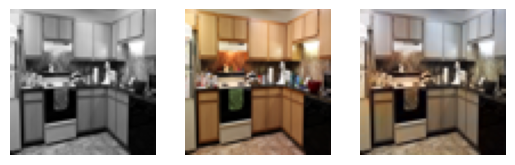

1 / 50

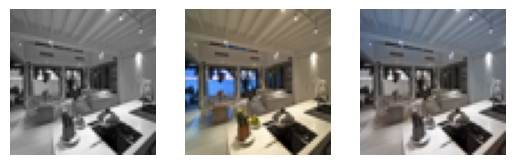

2 / 50

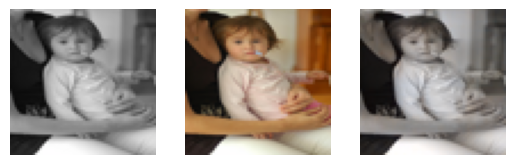

3 / 50

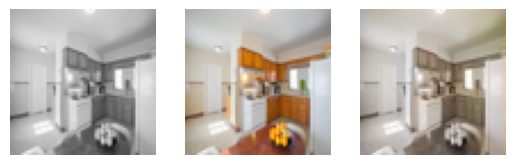

4 / 50

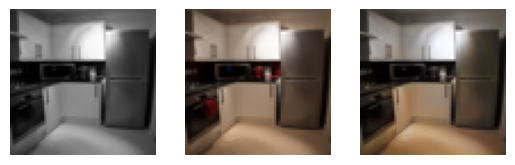

5 / 50

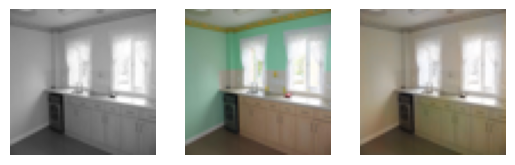

6 / 50

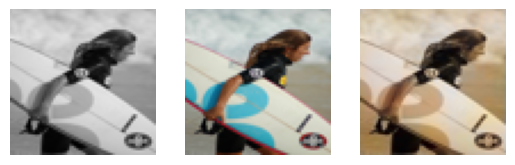

7 / 50

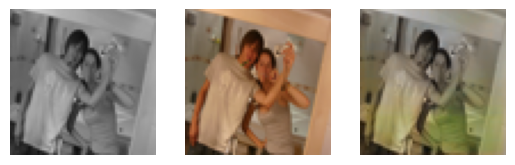

8 / 50

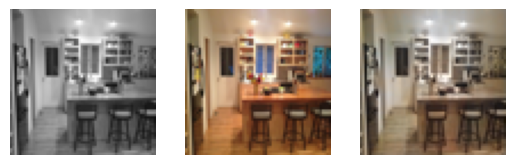

9 / 50

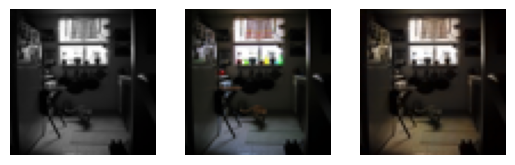

10 / 50

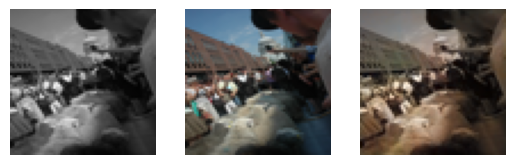

11 / 50

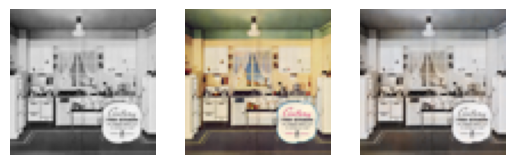

12 / 50

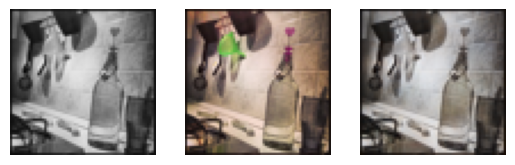

13 / 50

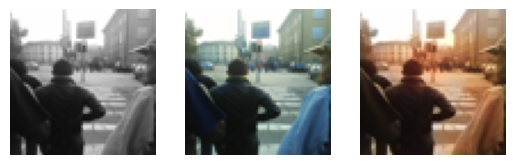

14 / 50

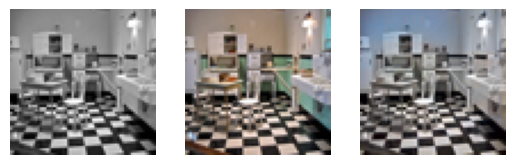

15 / 50

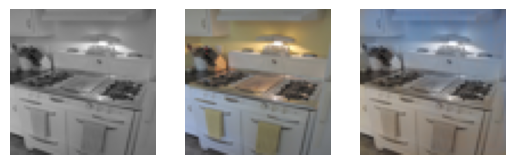

16 / 50

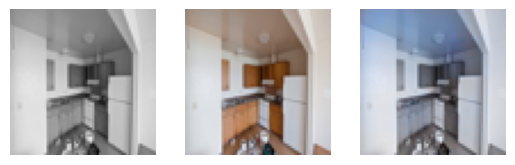

17 / 50

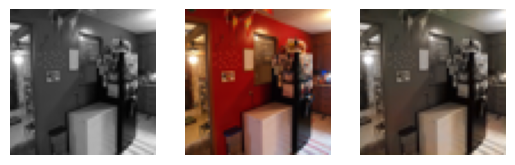

18 / 50

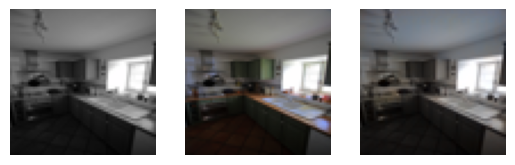

19 / 50

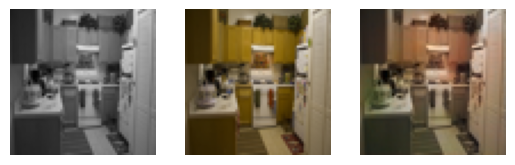

20 / 50

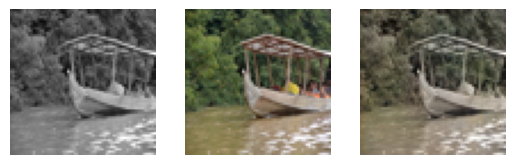

21 / 50

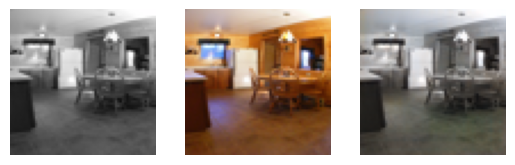

22 / 50

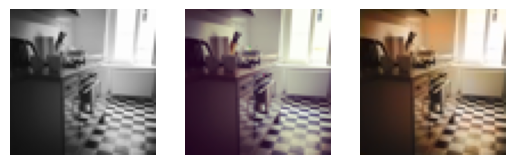

23 / 50

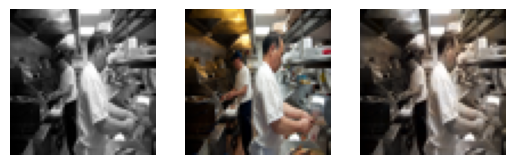

24 / 50

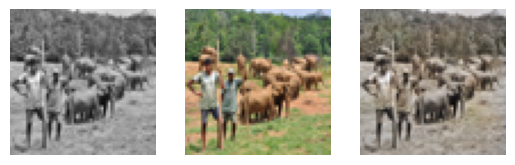

25 / 50

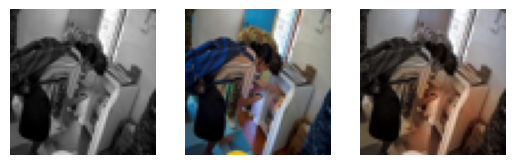

26 / 50

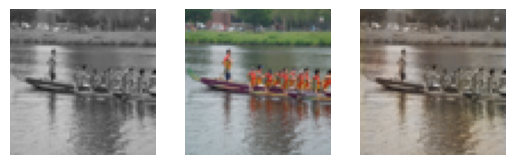

27 / 50

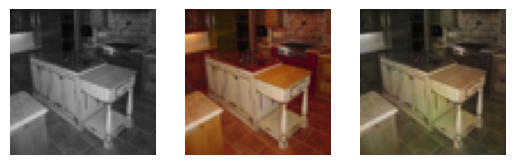

28 / 50

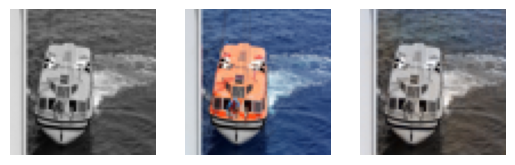

29 / 50

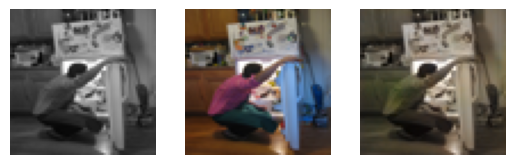

30 / 50

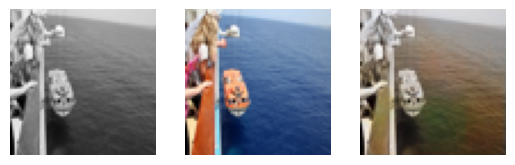

31 / 50

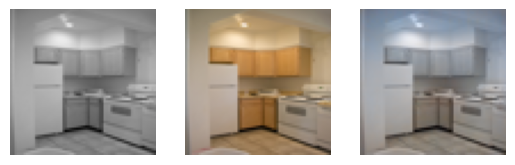

32 / 50

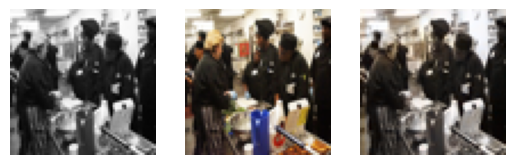

33 / 50

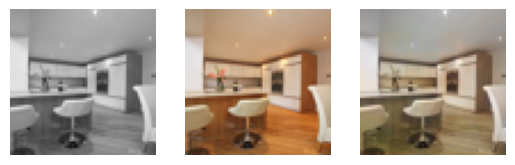

34 / 50

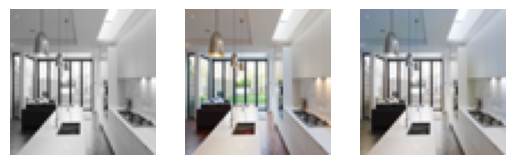

35 / 50

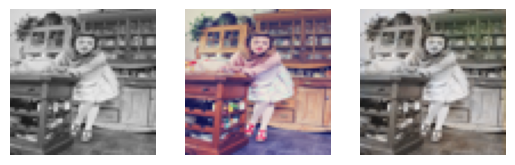

36 / 50

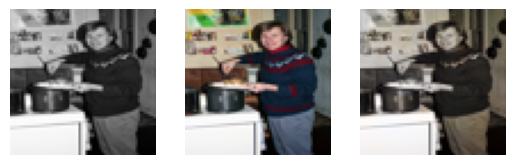

37 / 50

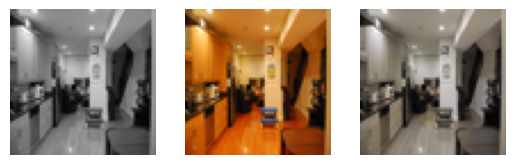

38 / 50

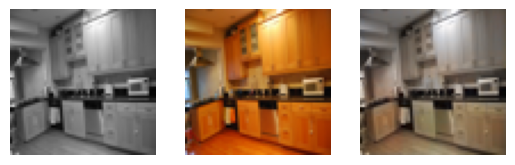

39 / 50

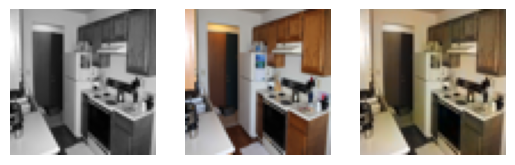

40 / 50

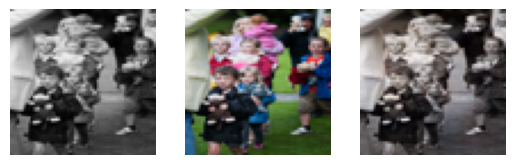

41 / 50

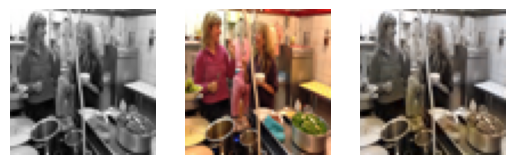

42 / 50

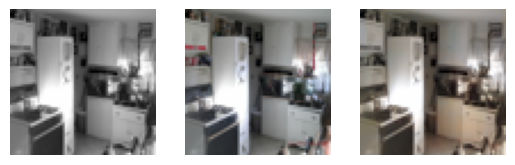

43 / 50

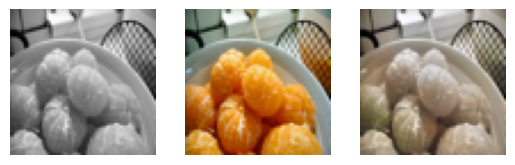

44 / 50

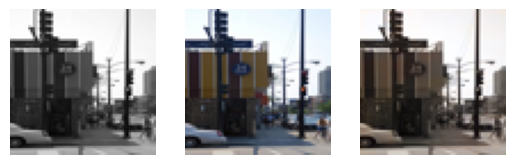

45 / 50

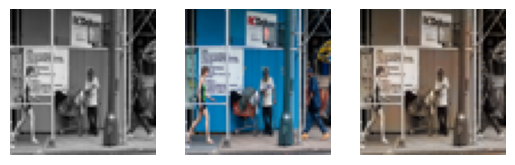

46 / 50

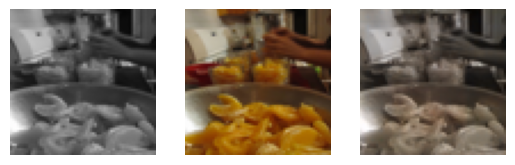

47 / 50

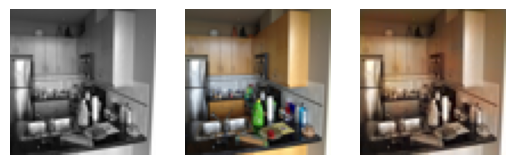

48 / 50

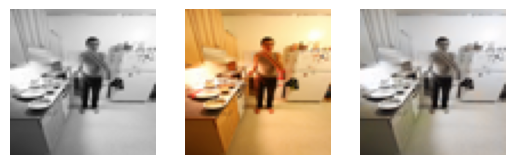

49 / 50

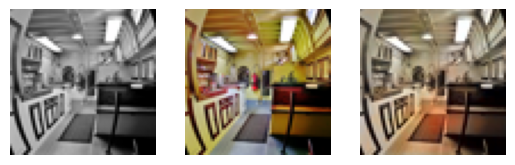

50 / 50

In [ ]:
import sys
total_count = len(Y_hat)
Y_hat = generator(X_test[:50])

for idx, (x, y, y_hat) in enumerate(zip(X_test[:50], Y_test[:50], Y_hat)):

    # Original RGB image
    orig_lab = np.dstack((x, y * 128))
    orig_rgb = lab2rgb(orig_lab)

    # Grayscale version of the original image
    grayscale_lab = np.dstack((x, np.zeros((64, 64, 2))))
    grayscale_rgb = lab2rgb(grayscale_lab)

    # Colorized image
    predicted_lab = np.dstack((x, y_hat * 128))
    predicted_rgb = lab2rgb(predicted_lab)

    # print(idx)

    fig = plt.figure()
    fig.add_subplot(1, 3, 1)
    plt.axis('off')
    plt.imshow(grayscale_rgb)
    fig.add_subplot(1, 3, 2)
    plt.axis('off')
    plt.imshow(orig_rgb)
    fig.add_subplot(1, 3, 3)
    plt.axis('off')
    plt.imshow(predicted_rgb)
    plt.show()

    #plt.axis('off')
    #plt.imshow(grayscale_rgb)
    #plt.savefig(os.path.join(WORKDIR, 'results', '{}-bw.png'.format(idx)), dpi=1)

    #plt.axis('off')
    #plt.imshow(orig_rgb)
    #plt.savefig(os.path.join(WORKDIR, 'results', '{}-gt.png'.format(idx)), dpi=1)

    #plt.axis('off')
    #plt.imshow(predicted_rgb)
    #plt.savefig(os.path.join(WORKDIR, 'results', '{}-gan.png'.format(idx)), dpi=1)

    sys.stdout.flush()
    sys.stdout.write('\r{} / {}'.format(idx + 1, total_count))

None


## Clearly, there is an issue with the colors. Try to find it out and share it with the community !
## I hope the project was a good start for you.